# Import libraries

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
#Author: Sanjay Kottapalli, Dana Pe'er lab (kottapas@mskcc.org)

import numpy as np
import numpy.matlib
import pandas as pd
import scanpy as sc
from scanpy.external.pp import magic
import scipy
from sklearn.metrics import adjusted_rand_score
from scipy.stats.mstats import zscore
from scipy.stats import pearsonr
import csv
import os
import matplotlib
matplotlib.use('TkAgg')
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
sns.set()
from copy import deepcopy
import timeit
from joblib import Parallel, delayed
from collections import Counter
np.random.seed(0)

# Define functions

In [3]:
def import_seqc_data(sample_name, path, dense=True):
    print('\nsample: ' + sample_name)
    if dense:
        PATH_TO_COUNT_CSV = path + sample_name + '_dense.csv'
        # import csv
        raw_counts = pd.read_csv(PATH_TO_COUNT_CSV, index_col=0, header=0)
        print(raw_counts.shape)
        #
        with open(PATH_TO_COUNT_CSV, "r") as f:
            reader = csv.reader(f)
            original_column_names = next(reader)
        # remove the first entry of this list, it belongs to the index column
        gene_names = original_column_names[1:]
        # and label the index column with name 'cell_barcodes'
        raw_counts.index.name = 'cell_barcodes'
        # convert indices to strings instead of integers for compatibility with scanpy
        raw_counts.index = raw_counts.index.astype(str)
        # python automatically converts duplicate column names to numbered column names,
        # e.g. 'X', 'X.1', 'X.2' etc. We can import the original column names from our CSV file:

        # now transpose the dataframe (for compatibility with panda's groupby function), 
        # then group by gene names, and add up the counts for genes with the same name
        raw_counts_transposed = raw_counts.T
        raw_counts_transposed_clean = raw_counts_transposed.groupby(gene_names, axis='index', sort=False).agg('sum')
        # transpose back
        raw_counts_clean = raw_counts_transposed_clean.T
        # if columns were added up, print how many:
        number_of_columns_removed = raw_counts.shape[1] - raw_counts_clean.shape[1]
        if number_of_columns_removed > 0:
            print(str(number_of_columns_removed) + ' columns were each merged with another column that had the same gene name.')
        # remove CLUSTER column:
        if 'CLUSTER' in raw_counts_clean.columns:
            raw_counts_clean.drop(columns='CLUSTER', inplace=True)
        # convert index type to string for compatibility with scanpy
        raw_counts_clean.index = raw_counts_clean.index.astype('str')
        adata = sc.AnnData(X = raw_counts_clean)
    else:
        barcodes = pd.read_csv(path+sample_name+'_sparse_counts_barcodes.csv', index_col=0, header=None)
        barcodes = barcodes[1].values
        barcodes = [str(i) for i in barcodes]
        gene_names = pd.read_csv(path+sample_name+'_sparse_counts_genes.csv', index_col=0, header=None)
        gene_names = gene_names[1].values
        sparse_counts = scipy.io.mmread(path+sample_name+'_sparse_molecule_counts.mtx').tocsc()
        #print("# of bytes: "+str(sparse_counts.data.nbytes))
        print(sparse_counts.shape)
        #sparse_counts = sparse_counts.toarray()#np.array(sparse_counts)
        #print(sparse_counts.shape)
        #raw_counts = pd.DataFrame.sparse.from_spmatrix(data=sparse_counts, index=barcodes, columns=gene_names)
        
        gene_dup = pd.Series(dict(Counter(gene_names)))
        gene_dup = gene_dup[gene_dup>1]
        #print(gene_dup)
        #print(len(set(gene_names)))
        gene_dup = list(gene_dup.keys())
        number_of_columns_removed = len(gene_dup)
        
        # sum of duplicate columns for each duplicate gene
        sum_dict = {i:sparse_counts[:,np.where(gene_names==i)[0]].sum(axis=1) for i in gene_dup}
        dup_index = []
        for i in gene_dup:
            dup_index += list(np.where(gene_names==i)[0])
        #print(sum_dict)
        #print(len(dup_index))
        #for i in sum_dict:
        #    print(sum_dict[i].sum(axis=0))
        
        #print(len(gene_names), sparse_counts.shape)
        keep_index = list(set(range(len(gene_names))) - set(dup_index))
        new_genes = list(gene_names[keep_index])
        new_counts = sparse_counts[:, keep_index]
        #print(len(new_genes), new_counts.shape)
        #print(new_counts.shape, type(new_counts))
        for i in sum_dict.keys():
            #print(sum_dict[i])
            #print(type(new_counts), type(sum_dict[i]))
            new_counts = scipy.sparse.hstack([new_counts, sum_dict[i]])
            new_genes.append(i)
        #print(len(new_genes), new_counts.shape)
        new_counts = new_counts.tocsc()
        print(new_counts.shape)#, type(new_counts))
        
        adata = sc.AnnData(X = new_counts, obs=pd.DataFrame(index=barcodes), var=pd.DataFrame(index=new_genes))
        
        if number_of_columns_removed > 0:
            print(str(number_of_columns_removed) + ' columns were each merged with another column that had the same gene name.')
       # take the min libsize in the dense cells, and 
        
        adata, mito_genes, RB_genes_in_data = qc_metrics(adata)
        # remove high mito frac cells
        cutoff = 20.0
        mito_val = adata.obs['pct_counts_mito']
        #print(mito_val)
        via_cells = mito_val[mito_val<cutoff]
        #print(via_cells)
        adata = adata[via_cells.index, :]
        print(adata.shape)
        
        PATH_TO_COUNT_CSV = path + sample_name + '_dense.csv'
        raw_counts = pd.read_csv(PATH_TO_COUNT_CSV, index_col=0, header=0)
        seqc_cells = [str(i) for i in raw_counts.index]
        libsize = adata.obs['original_total_counts'].sort_values(ascending=False)
        #pd.Series(index=adata.obs.index, data=np.array(np.sum(adata.X, axis=1).flatten())[0], dtype=str).sort_values(ascending=False)
        
        #difference = set(seqc_cells)-set([str(i) for i in libsize.iloc[:len(seqc_cells)+15000].index])
        #print(len(seqc_cells),len(difference))
        #print(seqc_cells[:20])
        #print(libsize.iloc[:20])
        
        adata = adata[libsize.iloc[:len(seqc_cells)+15000].index, :] # all dense cells + 15,000
        adata = sc.AnnData(X = adata.X, obs=pd.DataFrame(index=adata.obs.index), var=pd.DataFrame(index=adata.var.index))
        print(adata.shape)
        print("Cells filtered.")
    
    return adata

In [4]:
def qc_metrics(adata, path_RB=''):
    mito_genes = adata.var_names.str.startswith('MT-')
    adata.var['mito'] = mito_genes
    mito_genes = np.array(adata.var.index)[mito_genes]
    
    path_RB = path_RB+'RB_genes_human'
    with open(path_RB,'r') as file:
        lines = file.readlines()
    RB_genes = [x.rstrip('\n') for x in lines]
    data_genes = list(adata.var.index)
    RB_genes_in_data = set(data_genes).intersection(RB_genes)
    RB_genes_in_data = list(RB_genes_in_data)
    
    adata.var['ribo'] = False
    adata.var.loc[RB_genes_in_data, 'ribo'] = True
    
    sc.pp.calculate_qc_metrics(adata, qc_vars=('mito', 'ribo'), inplace=True)
    adata.obs['original_total_counts'] = adata.obs['total_counts']
    adata.obs['log10_original_total_counts'] = np.log10(adata.obs['original_total_counts'])
    print('QC metrics calculated.')
    
    return adata, mito_genes, RB_genes_in_data

In [5]:
def norm_filter(adata, mito_genes, RB_genes_in_data
                , log=True, remove_ribo=True, remove_mito=True, highly_var=False, markers=[]):
    
    adata.layers['raw_counts'] = adata.X
    # filter genes expressed in few cells
    print(adata.shape)
    sc.pp.filter_genes(adata, min_cells = 10)
    print(adata.shape)
    
    # libsize normalize
    if type(adata.X)==np.ndarray:
        med_libsize = np.median(np.sum(adata.X, axis=1))
    else:
        sums = np.array(np.sum(adata.X, axis=1).flatten())[0]
        #med_libsize = np.median(sums)
        if min(sums) == 0:
            empty_cells = set(np.where(sums==0)[0])
            print('# of 0-count droplets: '+str(len(empty_cells)))
            all_cells = set(adata.obs.index)
            keep_cells = all_cells-empty_cells
            adata = adata[keep_cells, :]
            sums = np.array(np.sum(adata.X, axis=1).flatten())[0]
        med_libsize = np.median(sums)

        print('Median library size: ' + str(med_libsize))

    sc.pp.normalize_total(adata)

    # log transform
    if log:
        adata.X = np.log2(adata.X+0.1) - np.log2(0.1)

        for i in deepcopy(markers):
            try:
                adata.obs[i+'_exp'] = adata[:,i].X
            except:
                markers.remove(i)
                print(i)

    else:
        for i in deepcopy(markers):
            try:
                adata.obs[i+'_exp'] = np.log2(adata[:,i].X+0.1)
            except:
                markers.remove(i)
                print(i)

    # remove ribosomal genes
    if remove_ribo:
        RB_genes_in_data.append('MALAT1')
        adata = adata[:,[x not in RB_genes_in_data for x in adata.var.index]]
        print(adata.shape)

    # remove mitochondrial genes
    if remove_mito:
        adata = adata[:,[x not in mito_genes for x in adata.var.index]]
        print(adata.shape)

    # highly variable gene selection
    print(highly_var)
    if highly_var:
        if not log:
            print('Im here1')
            sc.pp.highly_variable_genes(adata, layer='raw_counts', flavor='seurat_v3',max_mean=np.inf, n_top_genes=2000)#, batch_key='Sample ID')
            print(sum(adata.var['highly_variable']))
            adata.var.loc[markers, 'highly_variable'] = True
            print(sum(adata.var['highly_variable']))
            print(adata.shape)
        elif log:
            print('Im here2')
            sc.pp.highly_variable_genes(adata, layer=None, flavor='cell_ranger', max_mean=np.inf, n_top_genes=2000)#, batch_key='Sample ID')
            print(sum(adata.var['highly_variable']))
            adata.var.loc[markers, 'highly_variable'] = True
            print(sum(adata.var['highly_variable']))

    return adata, markers#adata_unlog, markers

In [6]:
def plot_pca(adata):
    #print("I am in here 1")
    
    print(adata.X)
    try:
        print(adata.shape)
        N = 1000
        adata_new = sc.tl.pca(adata, n_comps=N, copy = True)
    except:
        print(adata.shape) 
        N = min(adata.shape) - 1
        adata_new = sc.tl.pca(adata, n_comps=N, copy = True)
    
    #Plot variance explained
    x = range(len(adata_new.uns['pca']['variance_ratio']))
    y = adata_new.uns['pca']['variance_ratio']
    plt.scatter(x,y,s=4)
    plt.xlabel('PC')
    plt.ylabel('Fraction of variance explained')
    plt.title('Fraction of variance explained per PC')
    plt.show()
    
    #Plot cumulative variance
    cml_var_explained = np.cumsum(adata_new.uns['pca']['variance_ratio'])
    x = range(len(adata_new.uns['pca']['variance_ratio']))
    y = cml_var_explained
    plt.scatter(x,y,s=4)
    plt.xlabel('PC')
    plt.ylabel('Cumulative fraction of variance explained')
    plt.title('Cumulative fraction of variance explained by PCs')
    plt.show()
    
    return cml_var_explained, adata_new.uns['pca']['variance_ratio']
    
def kneepoint(vec):
    #print("I am in here 4")
    curve =  [1-x for x in vec]
    nPoints = len(curve)
    allCoord = np.vstack((range(nPoints), curve)).T
    np.array([range(nPoints), curve])
    firstPoint = allCoord[0]
    lineVec = allCoord[-1] - allCoord[0]
    lineVecNorm = lineVec / np.sqrt(np.sum(lineVec**2))
    vecFromFirst = allCoord - firstPoint
    scalarProduct = np.sum(vecFromFirst * numpy.matlib.repmat(lineVecNorm, nPoints, 1), axis=1)
    vecFromFirstParallel = np.outer(scalarProduct, lineVecNorm)
    vecToLine = vecFromFirst - vecFromFirstParallel
    distToLine = np.sqrt(np.sum(vecToLine ** 2, axis=1))
    idxOfBestPoint = np.argmax(distToLine)
    
    return idxOfBestPoint
    
def run_pca_knee(adata):
    cml, var = plot_pca(adata)

    knee = kneepoint(var)
    
    print("Knee point: "+str(knee))
    print("Explained variance: " + str(cml[knee]))

    x=list(range(len(cml)))
    plt.plot(x[:5*knee],cml[:5*knee])
    plt.show()

    adata_new = sc.tl.pca(adata, n_comps=knee+1, copy=True)
    sc.pl.pca_loadings(adata_new, components=range(1,4))
    
    return adata_new

In [7]:
def files_MAST(adata, cell_type = '', outdir = ''):
    
    # if directory doesn't exist, create it
    if not os.path.exists('../DEA/' + cell_type):
        os.makedirs('../DEA/' + cell_type)
    
    adata_celltype = deepcopy(adata)
    print(cell_type + '\t'+"Dimensions" + "\t"+ "{}".format(adata_celltype.shape))
    
    # make a dataframe for the expression matrix
    expmat = pd.DataFrame(adata_celltype.X, columns = adata_celltype.var.index, index = adata_celltype.obs.index)

    # make a dataframe for the observation data
    cdata = pd.DataFrame(adata_celltype.obs, columns=adata_celltype.obs.columns, index = adata_celltype.obs.index)
    
    expmat.to_csv(r'../DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv', index=True)
    cdata.to_csv(r'../DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv', index=True)
    
    print("Files written for {}".format(cell_type))

In [8]:
def run_MAST_for_celltype_condition(adata, cell_type):
    start_time = timeit.default_timer()
    MAST = './runMAST_condition.R'
    
    # run 
    files_MAST(adata = adata, cell_type = cell_type)
    
    expmat_Inputfile = ('../DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv')
    cdata_Inputfile = ('../DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv')
    output_file = '../DEA/' +  cell_type + "/MAST_DEA_" + cell_type + "_RESULTS.csv" 
    
    print("Running " + MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file )
    
    os.system(MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file)
    out_str = "Finished running MAST on"+ "( " + cell_type +  ")" +" in {} seconds.".format(timeit.default_timer()-start_time)
    
    return out_str

def run_MAST_for_celltype(adata, cell_type):
    start_time = timeit.default_timer()
    MAST = './runMAST.R'
    
    # run 
    files_MAST(adata = adata, cell_type = cell_type)
    
    expmat_Inputfile = ('DEA/'+ cell_type + '/adata_'+ cell_type+ '_exp_mat.csv')
    cdata_Inputfile = ('DEA/'+ cell_type + '/adata_'+ cell_type+ '_cdata.csv')
    output_file_cort = 'DEA/' +  cell_type + "/MAST_DEA_" + cell_type + "_cort.csv" 
    output_file_bs = 'DEA/' +  cell_type + "/MAST_DEA_" + cell_type + "_bs.csv" 
    
    print("Running " + MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file_cort + " " + output_file_bs)
    
    os.system(MAST + " " + expmat_Inputfile + " " + cdata_Inputfile + " " + output_file_cort + " " + output_file_bs)
    out_str = "Finished running MAST on"+ "( " + cell_type +  ")" +" in {} seconds.".format(timeit.default_timer()-start_time)
    
    return out_str

In [9]:
godsnot_64 = [
    # "#000000",  # remove the black, as often, we have black colored annotation
    "#d9d929", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6", "#A30059",
    "#FFDBE5", "#7A4900", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
    "#5A0007", "#809693", "#6A3A4C", "#1B4400", "#4FC601", "#3B5DFF", "#4A3B53", "#FF2F80",
    "#61615A", "#BA0900", "#6B7900", "#00C2A0", "#FFAA92", "#FF90C9", "#B903AA", "#D16100",
    "#DDEFFF", "#000035", "#7B4F4B", "#A1C299", "#300018", "#0AA6D8", "#013349", "#00846F",
    "#372101", "#FFB500", "#C2FFED", "#A079BF", "#CC0744", "#C0B9B2", "#C2FF99", "#001E09",
    "#00489C", "#6F0062", "#0CBD66", "#EEC3FF", "#456D75", "#B77B68", "#7A87A1", "#788D66",
    "#885578", "#FAD09F", "#FF8A9A", "#D157A0", "#BEC459", "#456648", "#0086ED", "#886F4C",
    "#34362D", "#B4A8BD", "#00A6AA", "#452C2C", "#636375", "#A3C8C9", "#FF913F", "#938A81",
    "#575329", "#00FECF", "#B05B6F", "#8CD0FF", "#3B9700", "#04F757", "#C8A1A1", "#1E6E00",
    "#7900D7", "#A77500", "#6367A9", "#A05837", "#6B002C", "#772600", "#D790FF", "#9B9700",
    "#549E79", "#FFF69F", "#201625", "#72418F", "#BC23FF", "#99ADC0", "#3A2465", "#922329",
    "#5B4534", "#FDE8DC", "#404E55", "#0089A3", "#CB7E98", "#A4E804", "#324E72"]

# Populate input parameters

In [10]:
# populate from command line
samples = ['1819_C1029_Ctrl_ES_Cort_IGO_10837_23', '1820_C1029_Ctrl_ES_BS_IGO_10856_3', '1821_996_VE_ES_Cort_IGO_10875_6', '1822_996_VE_ES_BS_IGO_10875_7']
indir = '../input/'
outdir = '../output_Nov/'
figures = '../figures/'

In [11]:
adata_inhi = sc.read_h5ad(outdir+'adata_high_var_Inhibitory_clusters.h5ad')

# Subset Exci Neurons Brainstem & Input original Adata

In [12]:
adata_inhi_BS = adata_inhi.copy()
adata_inhi_BS = adata_inhi[adata_inhi.obs['B_region'].isin(['BrainStem']),:]
adata_inhi_BS.shape

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(5596, 17538)

In [13]:
adata_inhi_BS.obs.Condition.value_counts()

VE         3643
Control    1953
Name: Condition, dtype: int64

In [14]:
broad_clusters = adata_inhi_BS.obs['Condition']
unique_clusters = np.unique(broad_clusters.values)
samples = adata_inhi_BS.obs['Sample ID']
print('Cell counts in each cluster for each sample: ')

for cluster in unique_clusters:
    print('Cluster: '+str(cluster))
    index = broad_clusters[broad_clusters==cluster].index
    count = Counter(samples[index].values)
    print(count)

Cell counts in each cluster for each sample: 
Cluster: Control
Counter({'1820_C1029_Ctrl_ES_BS_IGO_10856_3': 1953})
Cluster: VE
Counter({'1822_996_VE_ES_BS_IGO_10875_7': 3643})


In [15]:
path_to_h5ad_file = outdir+'adata.h5ad'
adata = sc.read_h5ad(path_to_h5ad_file)
print(adata)
# Add a new column describing the sample condition
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1819_C1029_Ctrl_ES_Cort_IGO_10837_23', "Control", "NA")
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1820_C1029_Ctrl_ES_BS_IGO_10856_3', "Control", adata.obs['Condition'])
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1821_996_VE_ES_Cort_IGO_10875_6', "VE", adata.obs['Condition'])
adata.obs['Condition'] = np.where(adata.obs['Sample ID'] == '1822_996_VE_ES_BS_IGO_10875_7', "VE", adata.obs['Condition'])


adata.obs.head()

AnnData object with n_obs × n_vars = 26101 × 22292
    obs: 'Sample ID'


,Sample ID,Condition
cell_barcodes,,
120703436570020_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455227244_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455251884_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120703455704877_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control
120718441244516_1819_C1029_Ctrl_ES_Cort_IGO_10837_23,1819_C1029_Ctrl_ES_Cort_IGO_10837_23,Control


In [16]:
# Add a new column describing the sample condition
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1819_C1029_Ctrl_ES_Cort_IGO_10837_23', "Cortex", "NA")
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1820_C1029_Ctrl_ES_BS_IGO_10856_3', "BrainStem", adata.obs['B_region'])
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1821_996_VE_ES_Cort_IGO_10875_6', "Cortex", adata.obs['B_region'])
adata.obs['B_region'] = np.where(adata.obs['Sample ID'] == '1822_996_VE_ES_BS_IGO_10875_7', "BrainStem", adata.obs['B_region'])


#adata.obs
# count the number of NAs
sum(pd.isna(adata.obs['B_region']))

0

In [17]:
adata_inhi_BS = adata[adata_inhi_BS.obs.index, :]
adata_inhi_BS.shape

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(5596, 22292)

# Pre-processing

## QC

In [18]:
adata_inhi_BS, mito_genes, RB_genes_in_data = qc_metrics(adata_inhi_BS)
markers = []
if type(adata_inhi_BS.X)==np.ndarray:
    pass
else:
    print(type(adata_inhi_BS.X))
    #print(adata_norm.X.shape)
    adata_inhi_BS.X = adata_inhi_BS.X.toarray()
    #print(adata_norm.X.shape)
adata_inhi_BS.X = pd.DataFrame(data=adata_inhi_BS.X).fillna(0).values

Trying to set attribute `.var` of view, copying.


QC metrics calculated.
<class 'scipy.sparse.csr.csr_matrix'>


In [19]:
adata_inhi_BS.shape

(5596, 22292)

## Normalization

In [20]:
markers = []
adata_inhi_BS, markers = norm_filter(adata_inhi_BS, mito_genes, RB_genes_in_data, markers=[], highly_var=True)
adata_inhi_BS.obs.head()

(5596, 22292)


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


(5596, 17471)
(5596, 17283)
(5596, 17270)
True
Im here2


Trying to set attribute `.uns` of view, copying.


2000
2000


,Sample ID,Condition,B_region,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mito,log1p_total_counts_mito,pct_counts_mito,total_counts_ribo,log1p_total_counts_ribo,pct_counts_ribo,original_total_counts,log10_original_total_counts
cell_barcodes,,,,,,,,,,,,,,,,,,,
228049567005099_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,BrainStem,3418,8.137103,7715.0,8.951052,16.733636,24.160726,33.130266,48.593649,19.0,2.995732,0.246273,67.0,4.219508,0.868438,7715.0,3.887336
130127238486260_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,BrainStem,2351,7.763021,4678.0,8.450840,21.782813,29.307396,38.691749,55.066268,2.0,1.098612,0.042753,32.0,3.496508,0.684053,4678.0,3.670060
157062500596979_1820_C1029_Ctrl_ES_BS_IGO_10856_3,1820_C1029_Ctrl_ES_BS_IGO_10856_3,Control,BrainStem,6004,8.700348,29616.0,10.296103,25.020259,32.138033,40.582793,54.109265,76.0,4.343805,0.256618,125.0,4.836282,0.422069,29616.0,4.471527
196104827070709_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,BrainStem,2923,7.980708,6405.0,8.764991,21.748634,28.040593,36.721311,52.318501,7.0,2.079442,0.109290,80.0,4.394449,1.249024,6405.0,3.806519
129978418776485_1822_996_VE_ES_BS_IGO_10875_7,1822_996_VE_ES_BS_IGO_10875_7,VE,BrainStem,2561,7.848543,5344.0,8.583917,20.677395,28.517964,38.005240,54.135479,23.0,3.178054,0.430389,73.0,4.304065,1.366018,5344.0,3.727866


## PCA

[[0.      0.      0.      ... 0.      0.      0.     ]
 [0.      0.      0.      ... 0.      0.      0.     ]
 [2.65934 0.      0.      ... 0.      0.      0.     ]
 ...
 [0.      0.      0.      ... 0.      0.      0.     ]
 [0.      0.      0.      ... 0.      0.      0.     ]
 [0.      0.      0.      ... 0.      0.      0.     ]]
(5596, 17270)


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


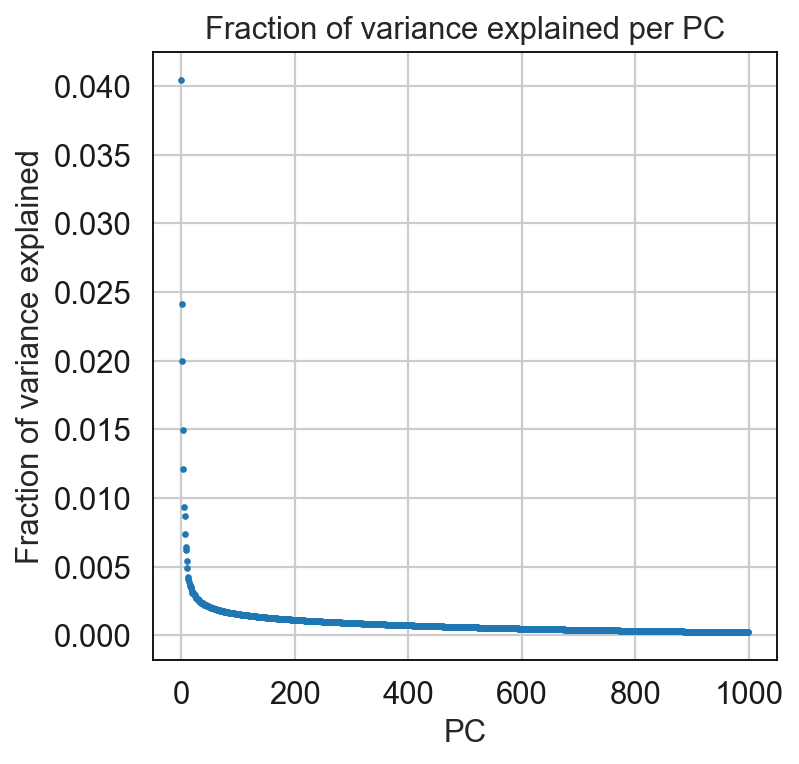

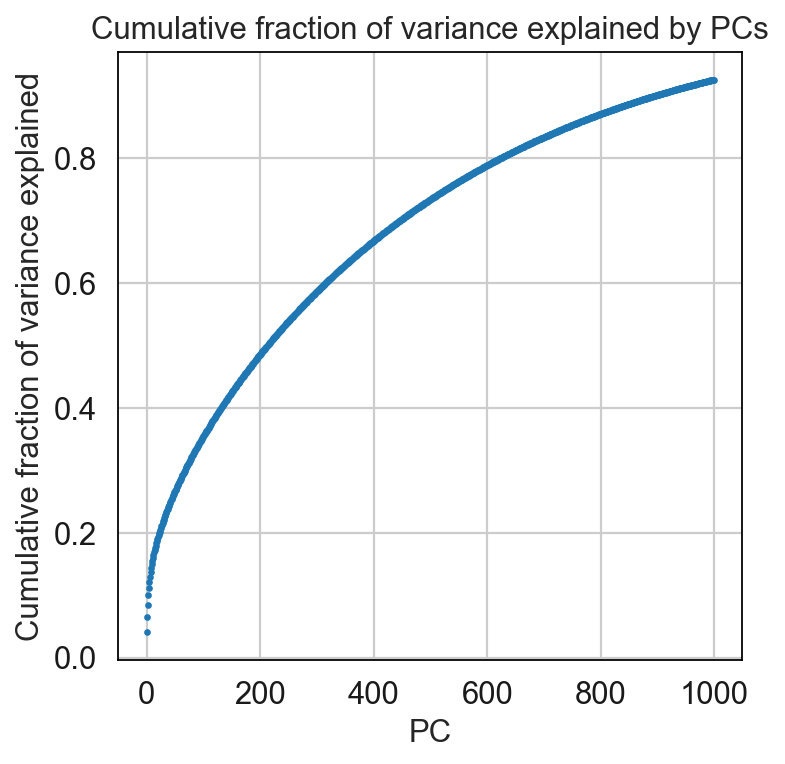

Knee point: 26
Explained variance: 0.21051194


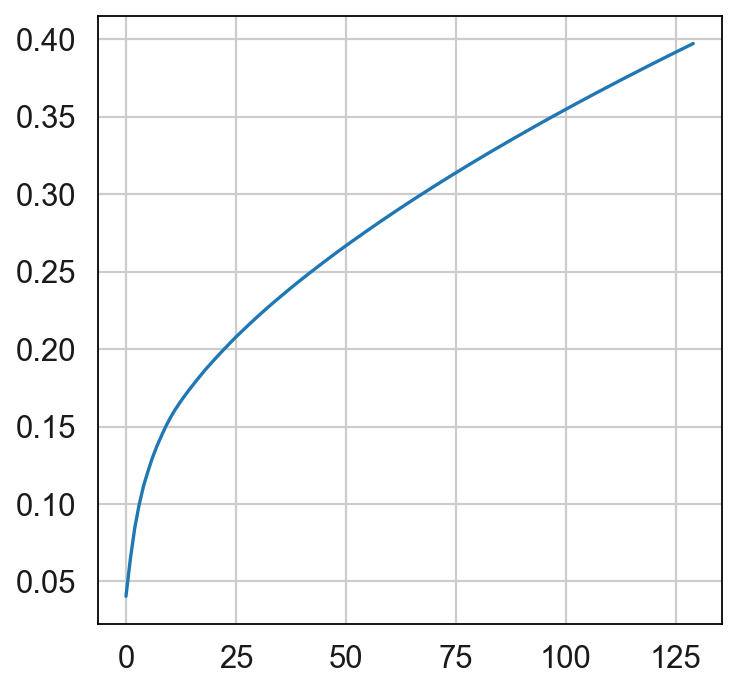

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:238: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/matplotlib/backends/backend_agg.py:201: RuntimeWarning: Glyph 8942 missing from current font.
  font.set_text(s, 0, flags=flags)


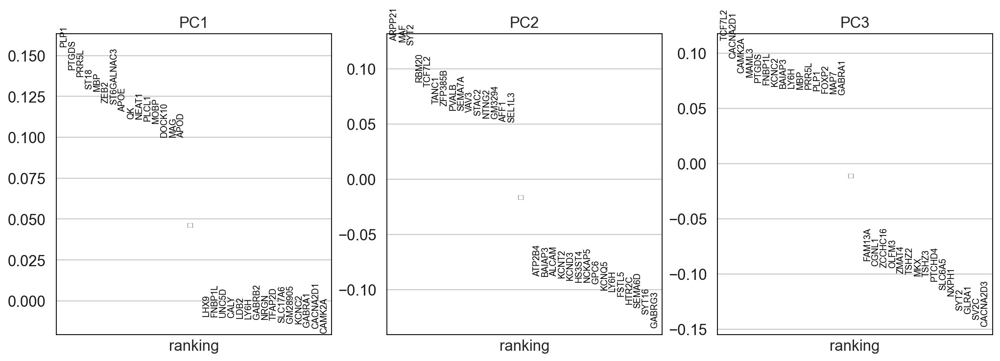

(5596, 17270)


/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [21]:
sc.set_figure_params(figsize=(5, 5))
adata_inhi_BS = run_pca_knee(adata_inhi_BS)#, 0.5)
adata_inhi_BS.obs['PC 1'] = adata_inhi_BS.obsm['X_pca'][:,0] # optional
adata_inhi_BS.obs['PC 2'] = adata_inhi_BS.obsm['X_pca'][:,1]
adata_inhi_BS.obs['PC 3'] = adata_inhi_BS.obsm['X_pca'][:,2]

print(adata_inhi_BS.shape)
adata_inhi_BS.X = pd.DataFrame(adata_inhi_BS.X).fillna(0).values
index_list = np.arange(adata_inhi_BS.shape[0])
np.random.shuffle(index_list)
adata_inhi_BS = adata_inhi_BS[index_list,:]

In [22]:
print(adata_inhi_BS.shape)
adata_inhi_BS.X = pd.DataFrame(adata_inhi_BS.X).fillna(0).values
index_list = np.arange(adata_inhi_BS.shape[0])
np.random.shuffle(index_list)
adata_inhi_BS = adata_inhi_BS[index_list,:]

(5596, 17270)


## Phenograph

Finding 10 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.45139122009277344 seconds
Jaccard graph constructed in 2.7501111030578613 seconds
Wrote graph to binary file in 0.2617371082305908 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.907318
After 4 runs, maximum modularity is Q = 0.908491
Louvain completed 24 runs in 1.2653357982635498 seconds
Sorting communities by size, please wait ...
PhenoGraph complete in 5.455778121948242 seconds


Trying to set attribute `.obs` of view, copying.


Finding 15 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.3960590362548828 seconds
Jaccard graph constructed in 1.0760650634765625 seconds
Wrote graph to binary file in 0.22742819786071777 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.885999
After 3 runs, maximum modularity is Q = 0.887329
Louvain completed 23 runs in 1.4503710269927979 seconds
Sorting communities by size, please wait ...
PhenoGraph complete in 4.4843590259552 seconds
Finding 20 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.3919980525970459 seconds
Jaccard graph constructed in 1.4429118633270264 seconds
Wrote graph to binary file in 0.21278905868530273 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.870641
After 2 runs, maximum modularity is Q = 0.873728
After 8 runs, maximum modularity is Q = 0.874886
After 20 runs, maximum modularity is Q = 0.876704
Louva

Text(0.5, 0, 'k')

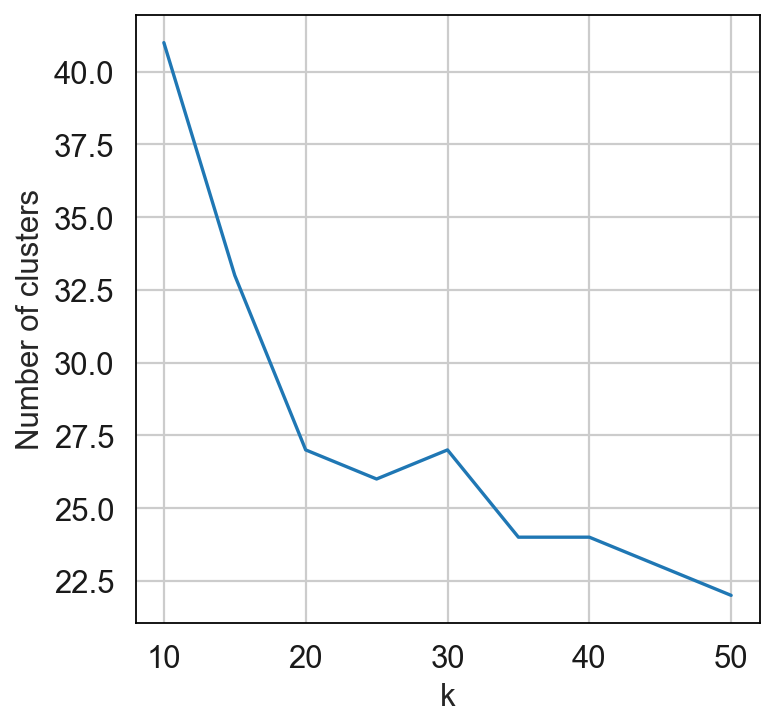

In [23]:
k_list = list(range(10, 55, 5))
n_clusters = []
for k in k_list:
    communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(adata_inhi_BS.obsm['X_pca']),k=k)
    n_clusters.append(len(np.unique(communities)))
    adata_inhi_BS.obs['PhenoGraph_clusters_inhi_BS'+str(k)] = pd.Categorical(communities)
    adata_inhi_BS.uns['PhenoGraph_Q_'+str(k)] = Q
    adata_inhi_BS.uns['PhenoGraph_k_'+str(k)] = k
plt.plot(k_list,n_clusters)
plt.ylabel("Number of clusters")
plt.xlabel("k")

In [24]:
Rand_index_df = pd.DataFrame(np.zeros((len(k_list), len(k_list))),index=k_list,columns=k_list)
Rand_index_df.index.name='k1'
Rand_index_df.columns.name='k2'
row_ind = 0
for run1 in range(len(k_list)):
    col_ind = 0
    for run2 in range(len(k_list)):
        Rand_index_df.iloc[row_ind,col_ind] = adjusted_rand_score(
            adata_inhi_BS.obs['PhenoGraph_clusters_inhi_BS'+str(k_list[run1])].values,
            adata_inhi_BS.obs['PhenoGraph_clusters_inhi_BS'+str(k_list[run2])].values)
        col_ind = col_ind+1
    row_ind = row_ind+1
    

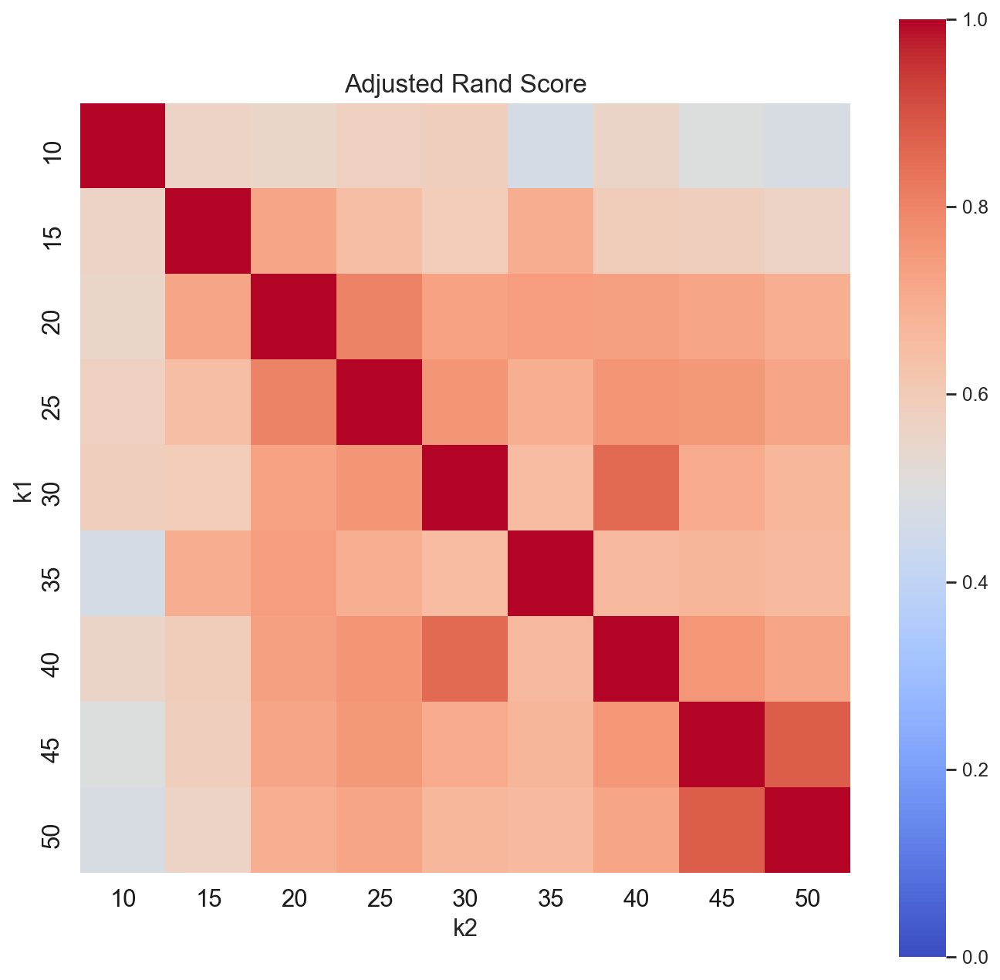

In [25]:
Rand_fig = plt.figure(figsize = (10,10))
plt.xlabel('k1')
plt.ylabel('k2')
plt.title('Adjusted Rand Score',fontsize=15)
sns.set(font_scale=1)
sns.heatmap(Rand_index_df, cmap=('coolwarm'), square=True, vmin=0, vmax=1)
# plt.colorbar(vmin=0)
plt.show();plt.close()


In [26]:
k = 50 # choose k
communities, graph, Q = sc.external.tl.phenograph(pd.DataFrame(adata_inhi_BS.obsm['X_pca']),k=k) # run PhenoGraph
adata_inhi_BS.obs['PhenoGraph_clusters_inhi_BS'] = pd.Categorical(communities)
adata_inhi_BS.uns['PhenoGraph_Q'] = Q
adata_inhi_BS.uns['PhenoGraph_k'] = k

Finding 50 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.47860193252563477 seconds
Jaccard graph constructed in 1.5988993644714355 seconds
Wrote graph to binary file in 0.699613094329834 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.82197
After 2 runs, maximum modularity is Q = 0.826351
After 10 runs, maximum modularity is Q = 0.82749
After 11 runs, maximum modularity is Q = 0.829183
Louvain completed 31 runs in 3.695878267288208 seconds
Sorting communities by size, please wait ...
PhenoGraph complete in 7.85404896736145 seconds


# Vizualization & Markers

## Vizualize Excitatory BS sub-clusters

In [27]:
sc.set_figure_params(figsize=(8, 8))
sc.pp.neighbors(adata_inhi_BS, method='umap', use_rep='X_pca')
sc.tl.umap(adata_inhi_BS, random_state=None)

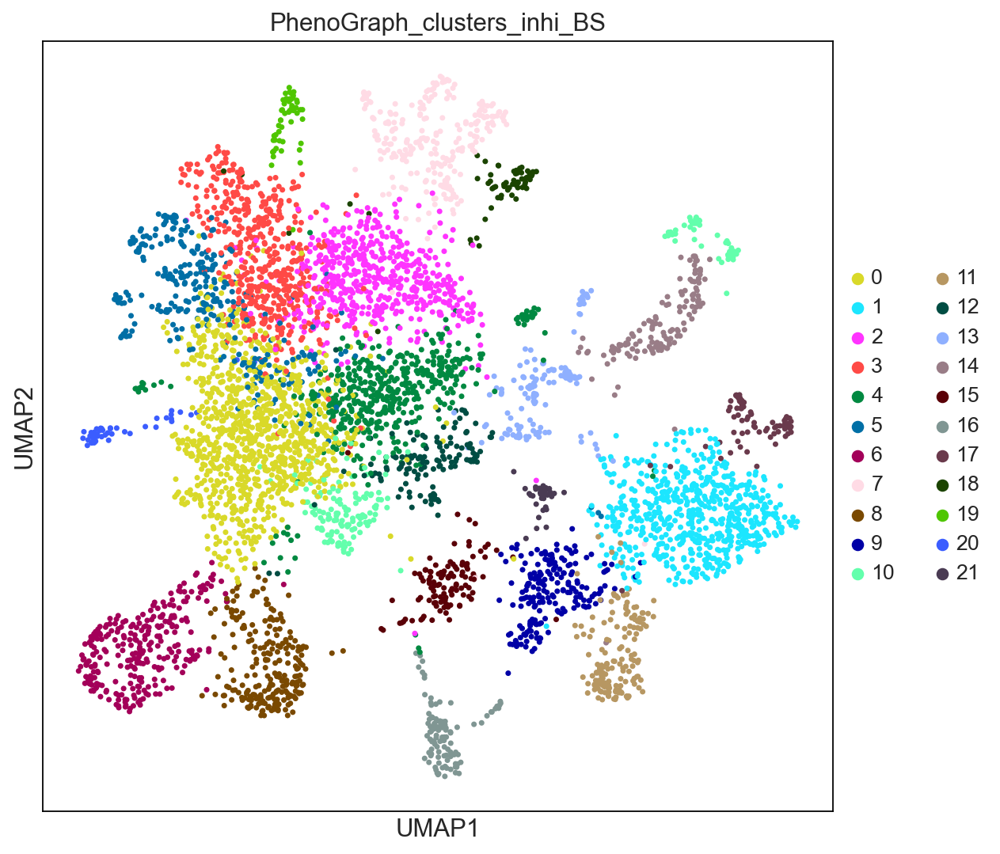

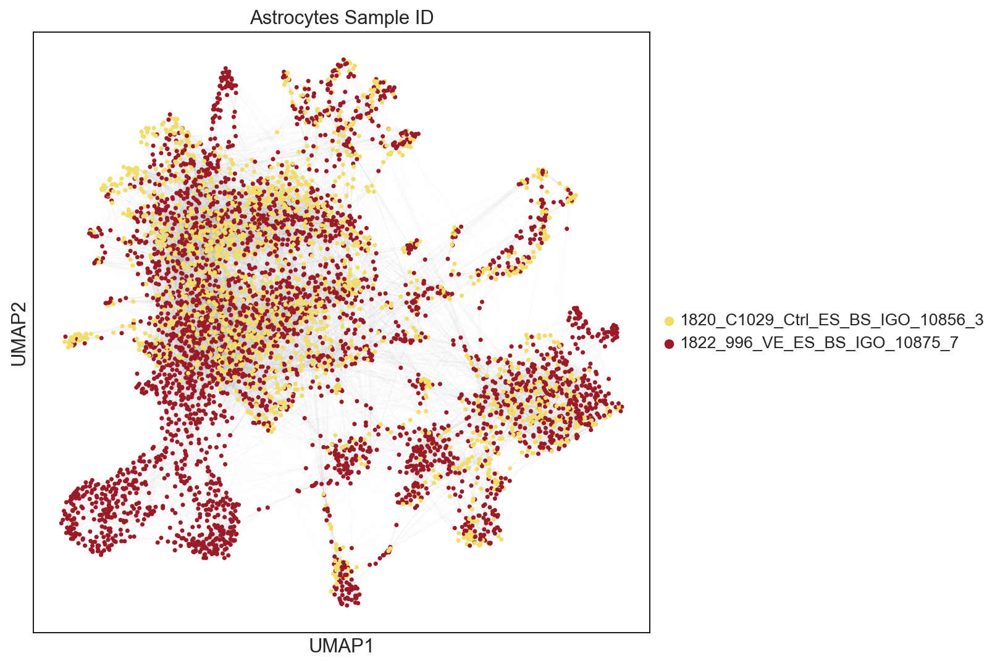

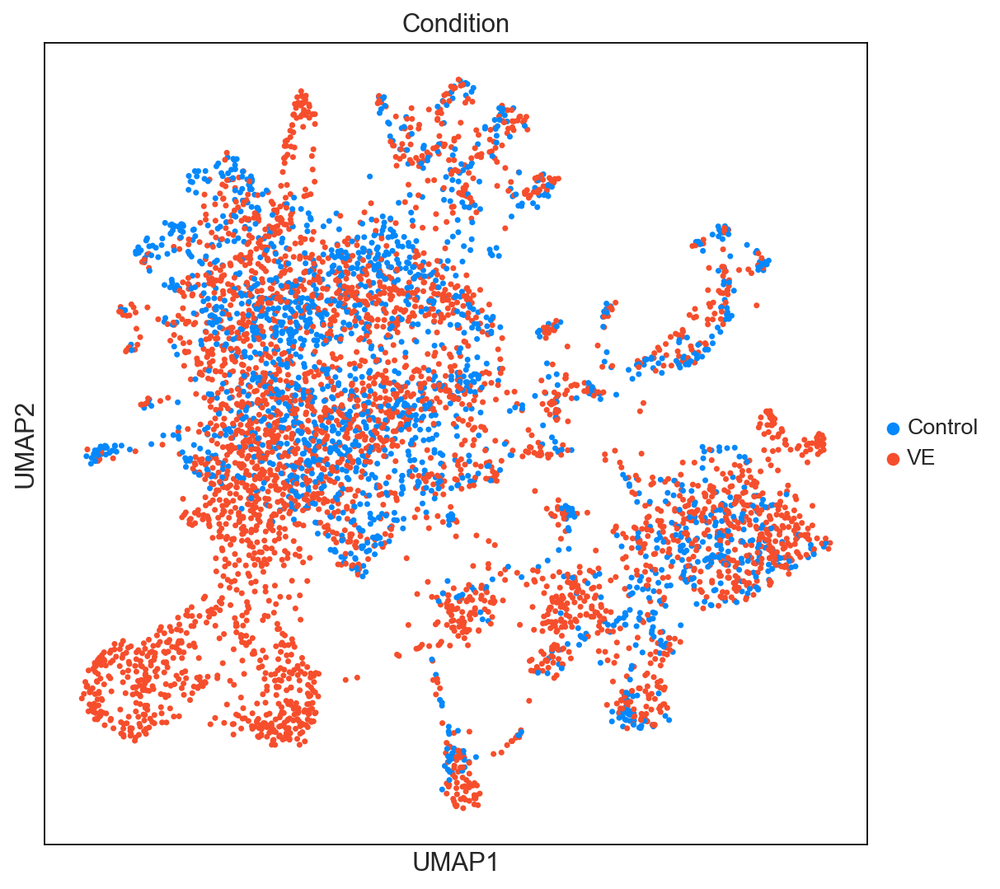

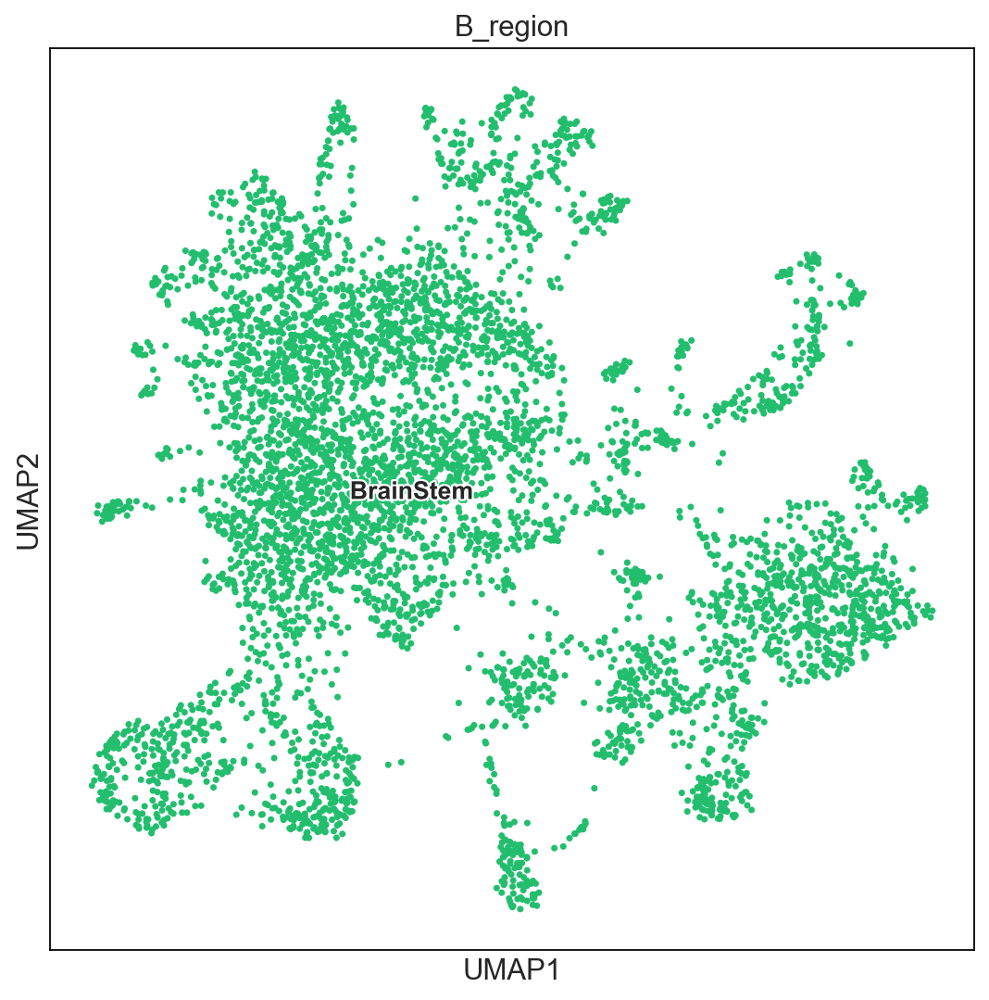

In [79]:
sc.pl.umap(adata_inhi_BS,
           color=['PhenoGraph_clusters_inhi_BS'],
           ncols=2,
           sort_order=False,
           palette=godsnot_64, # 'palette' specifies the colormap to use
           cmap='Spectral_r',
           #legend_loc='on data',
           legend_fontsize=12, size = 40,
           legend_fontoutline=2,)

sc.pl.umap(adata_inhi_BS, 
           color= ['Sample ID'],
           ncols=2,
           edges = True,
           edges_width= 0.01,
           palette= ["#F2DD66", "#9A1B27", "#0359AE", "#14B09B"],
           size=40, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Astrocytes Sample ID"])

sc.pl.umap(adata_inhi_BS,
           color=['Condition'],
           ncols=2,
           sort_order=False,
           palette=['#0488FC','#F64E2C'], # 'palette' specifies the colormap to use
           cmap='Spectral_r',
           legend_fontsize=12, size = 40,
           legend_fontoutline=2)

sc.pl.umap(adata_inhi_BS,
           color=['B_region'],
           ncols=2,
           sort_order=False,
           palette= ["#22BE6E", "#EDAB13"], # 'palette' specifies the colormap to use
           cmap='Spectral_r',
           legend_loc='on data',
           legend_fontsize=12, size = 40,
           legend_fontoutline=2)



## Find markers (Oligo clusters)

In [30]:
cl_int_to_str = dict()
cl_int_to_str = {
    0 : 'In_BS_0',
    1 : 'In_BS_1',
    2 : 'In_BS_2',
    3 : 'In_BS_3',
    4 : 'In_BS_4',
    5 : 'In_BS_5',
    6 : 'In_BS_6',
    7 : 'In_BS_7',
    8 : 'In_BS_8',
    9 : 'In_BS_9',
    10 : 'In_BS_10',
    11 : 'In_BS_11',
    12 : 'In_BS_12',
    13 : 'In_BS_13',
    14 : 'In_BS_14',
    15 : 'In_BS_15',
    16 : 'In_BS_16',
    17 : 'In_BS_17',
    18 : 'In_BS_18',
    19 : 'In_BS_19',
    20 : 'In_BS_20',
    21 : 'In_BS_21'}

adata_inhi_BS.obs['PhenoGraph_clusters_inhi_BS_str'] = adata_inhi_BS.obs['PhenoGraph_clusters_inhi_BS'].map(cl_int_to_str).astype('category')

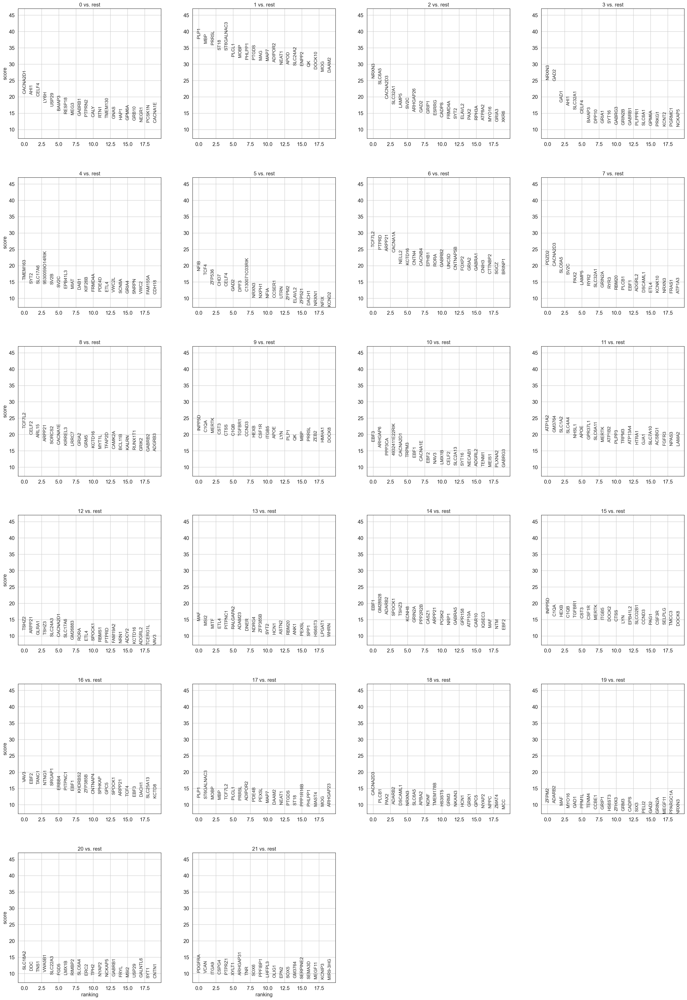

In [29]:
sc.tl.rank_genes_groups(adata_inhi_BS, groupby='PhenoGraph_clusters_inhi_BS', key_added="ranked_genes_pheno_inhi", method='wilcoxon')
sc.pl.rank_genes_groups(adata_inhi_BS, key = 'ranked_genes_pheno_inhi', fontsize=12)

In [ ]:
n_genes = 10000
key_ad ='ranked_genes_pheno_inhi'
result = adata_inhi_BS.uns[key_ad]
groups = result['names'].dtype.names
pval_table = pd.DataFrame(
        {group + '_' + key[:1]: result[key][group]
        for group in groups for key in ['names','logfoldchanges', 'pvals_adj']}).head(n_genes)
#pval_table.to_excel(os.path.join("/Users/fragkogs/Desktop/", key_ad + '_' + method + '_pval_table_' + '_clusters_' + str(n_genes) + 'genes_filtered_corrected.xlsx'), engine='openpyxl')

In [ ]:
#pval_table

In [ ]:
adata_inhi_BS.obs.PhenoGraph_clusters_inhi_BS.value_counts()

## Visualize marker genes using heatmap

In [31]:
adata_inhi_BS.layers['scaled'] = sc.pp.scale(adata_inhi_BS, copy=True).X

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


{'heatmap_ax': <AxesSubplot:>,
 'groupby_ax': <AxesSubplot:xlabel='PhenoGraph_clusters_inhi_BS_str'>,
 'dendrogram_ax': <AxesSubplot:>,
 'gene_groups_ax': <AxesSubplot:>}

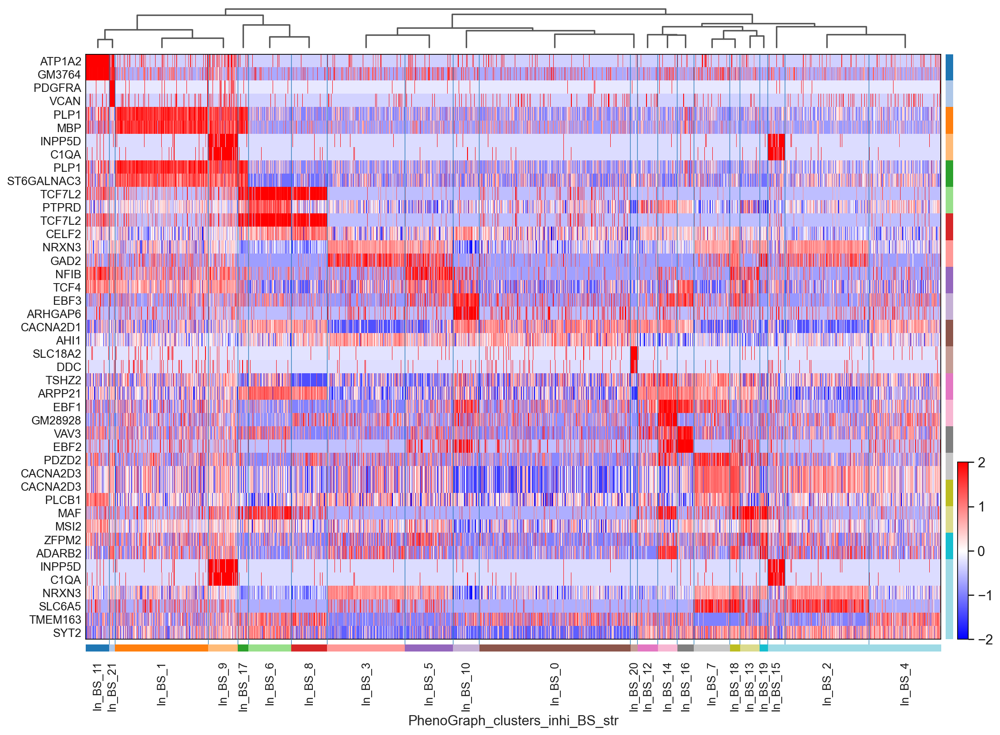

In [75]:
sc.tl.rank_genes_groups(adata_inhi_BS, groupby='PhenoGraph_clusters_inhi_BS_str', n_genes=adata_inhi_BS.shape[1], method='wilcoxon')
sc.pl.rank_genes_groups_heatmap(adata_inhi_BS, n_genes=2, use_raw=False, swap_axes=True, vmin=-2, vmax=2, cmap='bwr', layer='scaled', figsize=(16,12), show=False,)

In [ ]:
sc.pl.rank_genes_groups_matrixplot(adata_inhi_BS, n_genes=4, use_raw=False, swap_axes=True, vmin=-2, vmax=2, cmap='bwr', layer='scaled', figsize=(8,18), show=False)

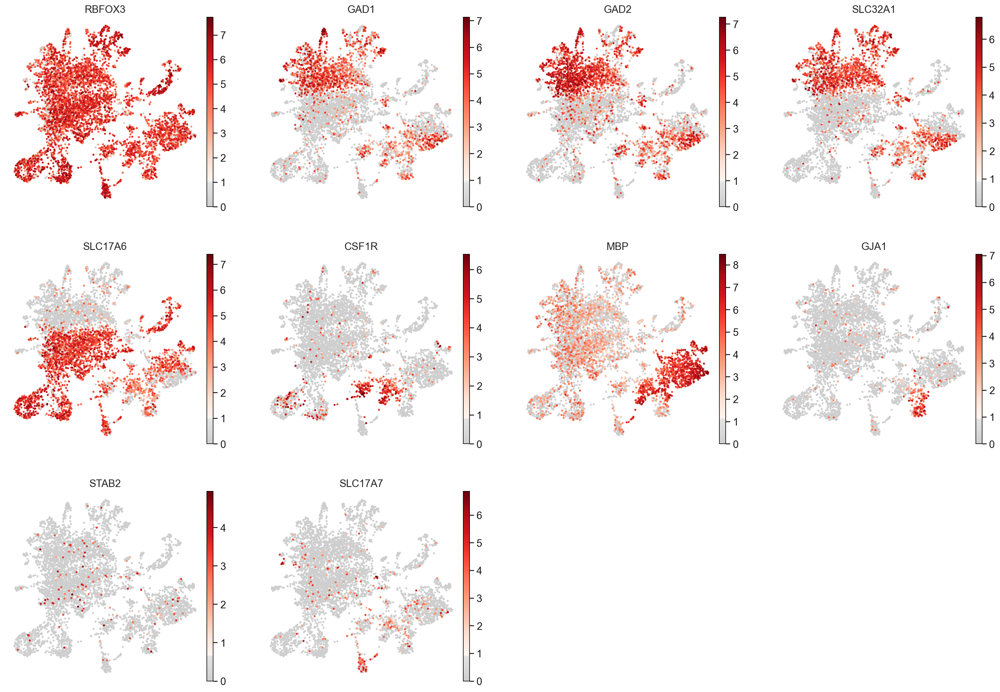

In [76]:
sc.set_figure_params(figsize=(5, 5))
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap = matplotlib.colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)
 
sc.pl.umap(adata_inhi_BS,
           size = 30,
           color=['RBFOX3','GAD1','GAD2','SLC32A1','SLC17A6','CSF1R','MBP','GJA1','STAB2','SLC17A7'],
           color_map=mymap,
          frameon=False, )

In [39]:
adata_inhi_BS.obs.PhenoGraph_clusters_inhi_BS.value_counts()

0     989
1     609
2     548
3     510
4     472
5     314
6     281
7     236
8     234
9     195
10    172
11    154
12    132
13    129
14    127
15    114
16    109
17     68
18     66
19     53
20     47
21     37
Name: PhenoGraph_clusters_inhi_BS, dtype: int64

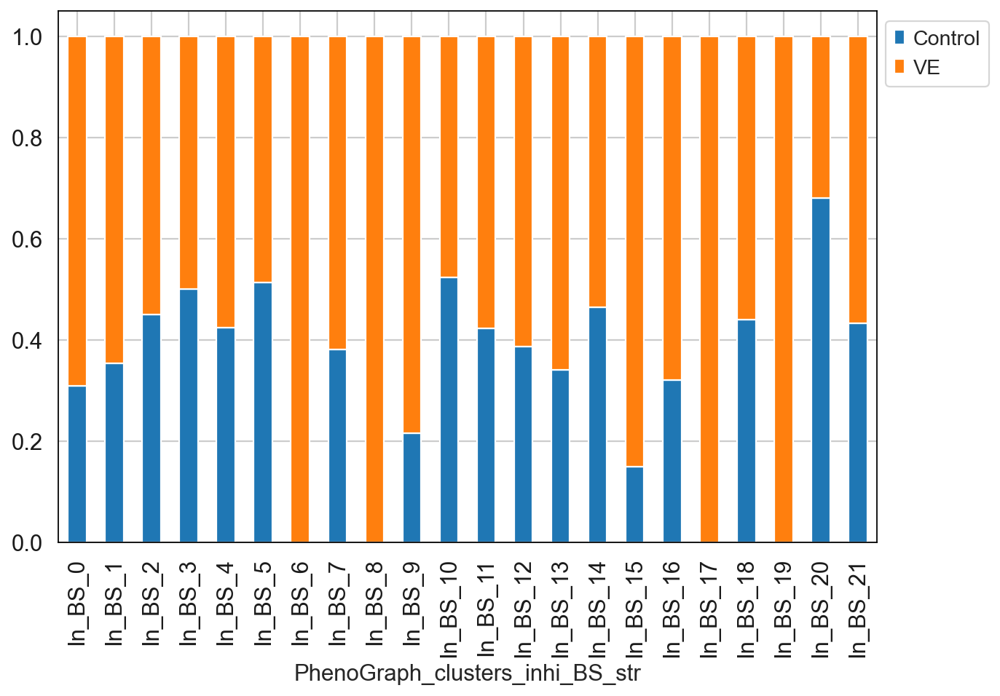

In [47]:
sc.set_figure_params(figsize=(9, 6))
tmp = pd.crosstab(adata_inhi_BS.obs['PhenoGraph_clusters_inhi_BS_str'],adata_inhi_BS.obs['Condition'], normalize='index')
tmp.plot.bar(stacked=True).legend(loc='upper right', bbox_to_anchor=(1.15, 1))

# Save result Adata Inhibotory neurons BS

In [48]:
#adata_inhi_BS.write_h5ad(outdir+'adata_high_var_Inhibitory_Neurons_Brainstem_clusters.h5ad')

Load the adata object that holds the latest cell type annotations..

In [ ]:
adata_inhi_BS = sc.read_h5ad(outdir+'adata_high_var_Inhibitory_Neurons_Brainstem_clusters.h5ad')

# Differential expression with MAST (BS ALL samples)

Oligodendrocytes Brainstem clusters only

In [49]:
run_MAST_for_celltype_condition(adata_inhi_BS, "Inhibitory_neurons")

Inhibitory_neurons	Dimensions	(5596, 17270)
Files written for Inhibitory_neurons
Running ./runMAST_condition.R ../DEA/Inhibitory_neurons/adata_Inhibitory_neurons_exp_mat.csv ../DEA/Inhibitory_neurons/adata_Inhibitory_neurons_cdata.csv ../DEA/Inhibitory_neurons/MAST_DEA_Inhibitory_neurons_RESULTS.csv


'Finished running MAST on( Inhibitory_neurons) in 990.348842166 seconds.'

In [50]:
# import the MAST results
adata_inhi_BS_res = pd.read_csv (filepath_or_buffer= '../DEA/Inhibitory_neurons_Brainstem/MAST_DEA_Inhibitory_neurons_RESULTS.csv')
print(adata_inhi_BS_res)

                 gene              p      p.fdr.adj     logFC
0             GM44511   0.000000e+00   0.000000e+00 -2.313643
1               UBE3A  1.923129e-242  1.660622e-238 -1.211300
2             GM26804  3.718530e-150  2.140634e-146 -1.485982
3              TCF7L2  1.258504e-115  5.433589e-112  1.251152
4             GM10076  8.727591e-115  3.014510e-111 -0.604707
...               ...            ...            ...       ...
17265  X2310016D03RIK   9.989036e-01   9.991350e-01  0.000130
17266    RP23.106G8.4   9.993432e-01   9.995168e-01  0.000036
17267         GM28448   9.995058e-01   9.996216e-01 -0.000046
17268           FIGLA   9.998301e-01   9.998880e-01  0.000044
17269   A730015C16RIK   9.999537e-01   9.999537e-01  0.000017

[17270 rows x 4 columns]


In [51]:
adata_inhi_BS_res[adata_inhi_BS_res['p.fdr.adj'] <= 0.05]

,gene,p,p.fdr.adj,logFC
0,GM44511,0.000000e+00,0.000000e+00,-2.313643
1,UBE3A,1.923129e-242,1.660622e-238,-1.211300
2,GM26804,3.718530e-150,2.140634e-146,-1.485982
3,TCF7L2,1.258504e-115,5.433589e-112,1.251152
4,GM10076,8.727591e-115,3.014510e-111,-0.604707
...,...,...,...,...
11519,GM43625,3.327606e-02,4.988521e-02,-0.008685
11520,SUSD4,3.328064e-02,4.988775e-02,0.087916
11521,GSTT1,3.328902e-02,4.989596e-02,-0.013070
11522,PARD3,3.329931e-02,4.990707e-02,0.045047


In [65]:
#filter DE results
adata_inhi_BS_res = adata_inhi_BS_res.sort_values(by='logFC', ascending=False)
# Upregulated genes
adata_inhi_BS_res_UP = adata_inhi_BS_res[(adata_inhi_BS_res['logFC'] >=0.5) & (adata_inhi_BS_res['p.fdr.adj'] <= 0.05)]
adata_inhi_BS_res_DOWN = adata_inhi_BS_res[(adata_inhi_BS_res['logFC'] <= -0.5) & (adata_inhi_BS_res['p.fdr.adj'] <= 0.05)]

adata_inhi_BS_res_DOWN.tail(10)

,gene,p,p.fdr.adj,logFC
43,LAS1L,7.105552e-49,2.788929e-46,-0.885664
30,GM26883,2.139546e-54,1.191934e-51,-0.891826
111,SEMA6D,3.120673e-32,4.811966e-30,-0.933776
7,AC149090.1,2.341501e-97,5.054715e-94,-0.991901
16,GM26835,1.751793e-65,1.779615e-62,-1.020061
25,SCN9A,6.587063e-58,4.375330e-55,-1.025086
8,P2RY14,2.380521e-93,4.567955e-90,-1.127297
1,UBE3A,1.923129e-242,1.660622e-238,-1.211300
2,GM26804,3.718530e-150,2.140634e-146,-1.485982
0,GM44511,0.000000e+00,0.000000e+00,-2.313643


In [69]:
adata_inhi_BS_res_UP.sort_values(by='p.fdr.adj', ascending=True).head(10)

,gene,p,p.fdr.adj,logFC
3,TCF7L2,1.258504e-115,5.433589e-112,1.251152
5,ERDR1,3.265752e-111,9.399923e-108,1.182718
6,CAMK1D,1.246181e-105,3.074507e-102,0.968272
9,TFAP2D,2.395298e-85,4.136680e-82,0.629807
12,CMSS1,1.424140e-80,1.891916e-77,0.533660
13,HEXB,1.676388e-75,2.067945e-72,0.910197
15,FKBP5,1.936247e-72,2.089937e-69,0.855578
18,LARS2,1.290008e-64,1.172550e-61,0.816825
19,PTGDS,2.507354e-64,2.165100e-61,1.303752
24,SYT2,2.395087e-58,1.654526e-55,1.239787


**FOR GO**

In [54]:
adata_inhi_BS_res_UP_for_GO = adata_inhi_BS_res[(adata_inhi_BS_res['p.fdr.adj'] <= 0.05) & (adata_inhi_BS_res['logFC'] >=0.05)]
adata_inhi_BS_res_DOWN_for_GO = adata_inhi_BS_res[(adata_inhi_BS_res['p.fdr.adj'] <= 0.05) & (adata_inhi_BS_res['logFC'] <=-0.05)]

## Volcano plot

In [55]:
from bioinfokit import analys, visuz

In [56]:
adata_inhi_BS_res = adata_inhi_BS_res.dropna()

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: divide by zero encountered in log10
  result = getattr(ufunc, method)(*inputs, **kwargs)
<__array_function__ internals>:5: UserWarning: Warning: converting a masked element to nan.
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/numpy/core/_asarray.py:83: UserWarning: Warning: converting a masked element to nan.
  return array(a, dtype, copy=False, order=order)
/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/matplotlib/ticker.py:665: UserWarning: Warning: converting a masked element to nan.
  s = self.format % xp


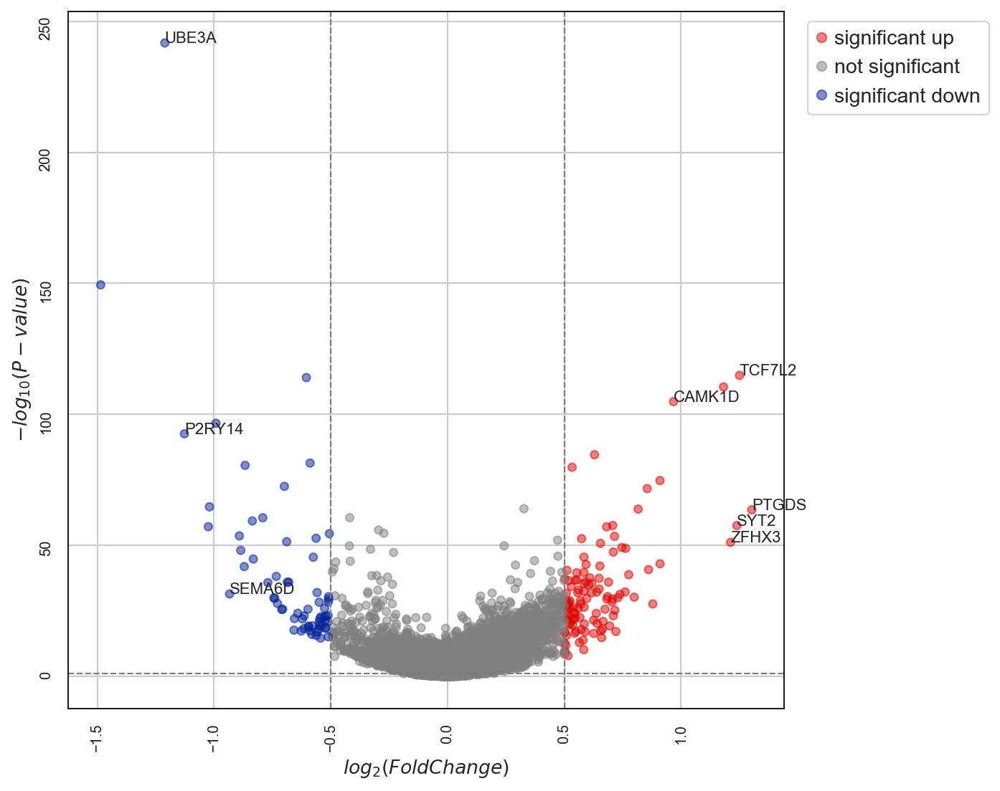

In [66]:
sc.set_figure_params(figsize=(8, 8))
visuz.gene_exp.volcano(df=adata_inhi_BS_res, lfc='logFC', pv='p',show=True, plotlegend=True, legendpos='upper right', 
    legendanchor=(1.3,1),color=("#E10600FF", "grey", "#00239CFF"), valpha=0.5, dotsize=25, geneid="gene", 
                       genenames=('PTGDS', 'TCF7L2', 'SYT2', 'ZFHX3','CAMK1D','UBE3A','P2RY14','SEMA6D'),  sign_line=True, gfont = 10, dim=(8,8), axlabelfontsize = 12, lfc_thr=(0.5, 0.5))

## ALL clusters Enrichr 

In [70]:
#Available databases : ‘Human’, ‘Mouse’, ‘Yeast’, ‘Fly’, ‘Fish’, ‘Worm’ 
import gseapy
gene_set_names = gseapy.get_library_name(database='Mouse')
#print(gene_set_names)

adata_inhi_BS_res_UP_n_list = adata_inhi_BS_res_UP_for_GO.gene.str.strip().tolist()
enr_res = gseapy.enrichr(gene_list=adata_inhi_BS_res_UP_n_list,
                     organism='Mouse',
                     gene_sets=['KEGG_2019_Mouse'],
                     description='pathway',
                     cutoff = 0.5)

In [71]:
enr_res.results.head(15)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,KEGG_2019_Mouse,Fc gamma R-mediated phagocytosis,50/87,1.216924e-12,3.589925e-10,0,0,4.757493,130.520370,NCF1;ARPC1B;ARPC1A;INPPL1;PIK3CD;PIK3CB;WASL;C...
1,KEGG_2019_Mouse,Autophagy,62/130,1.352086e-10,1.994327e-08,0,0,3.212243,72.995654,RAB7;MTMR14;PIK3CD;IRS2;PIK3CB;HMGB1;ZFYVE1;IG...
2,KEGG_2019_Mouse,Neurotrophin signaling pathway,57/121,1.331333e-09,1.309144e-07,0,0,3.135008,64.070427,YWHAE;ZFP369;ARHGDIG;PIK3CD;PIK3CB;CRKL;IKBKB;...
3,KEGG_2019_Mouse,Regulation of actin cytoskeleton,87/217,2.376867e-09,1.752939e-07,0,0,2.361766,46.898721,CYFIP2;CHRM2;ITGB1;CYFIP1;ITGB5;ARPC1B;ARPC1A;...
4,KEGG_2019_Mouse,Endocytosis,102/269,3.862520e-09,2.043753e-07,0,0,2.157719,41.799216,ZFYVE9;WIPF1;WIPF2;WIPF3;CBLB;IGF1R;KIF5C;KIF5...
5,KEGG_2019_Mouse,Lysosome,57/124,4.156785e-09,2.043753e-07,0,0,2.994054,57.780828,SCARB2;HEXB;CTSZ;HEXA;CLTA;TCIRG1;LIPA;LITAF;C...
6,KEGG_2019_Mouse,Chronic myeloid leukemia,39/76,2.777606e-08,1.170562e-06,0,0,3.701601,64.404495,CDKN1A;HDAC2;CDKN1B;CTBP1;PIK3CD;PIK3CB;PIK3R1...
7,KEGG_2019_Mouse,Insulin signaling pathway,58/139,2.107396e-07,7.771022e-06,0,0,2.518305,38.713005,PYGB;INPPL1;PRKAG1;PIK3CD;CBLB;IRS2;PIK3CB;HK2...
8,KEGG_2019_Mouse,Longevity regulating pathway,46/102,2.540840e-07,8.328307e-06,0,0,2.885713,43.821281,HDAC2;PRKAA2;CLPB;ATF6B;PRKAG1;EHMT1;PIK3CD;IR...
9,KEGG_2019_Mouse,FoxO signaling pathway,54/132,1.147951e-06,3.386454e-05,0,0,2.433066,33.278338,CDKN1A;CDKN1B;SETD7;PRKAG1;PIK3CD;IRS2;PIK3CB;...


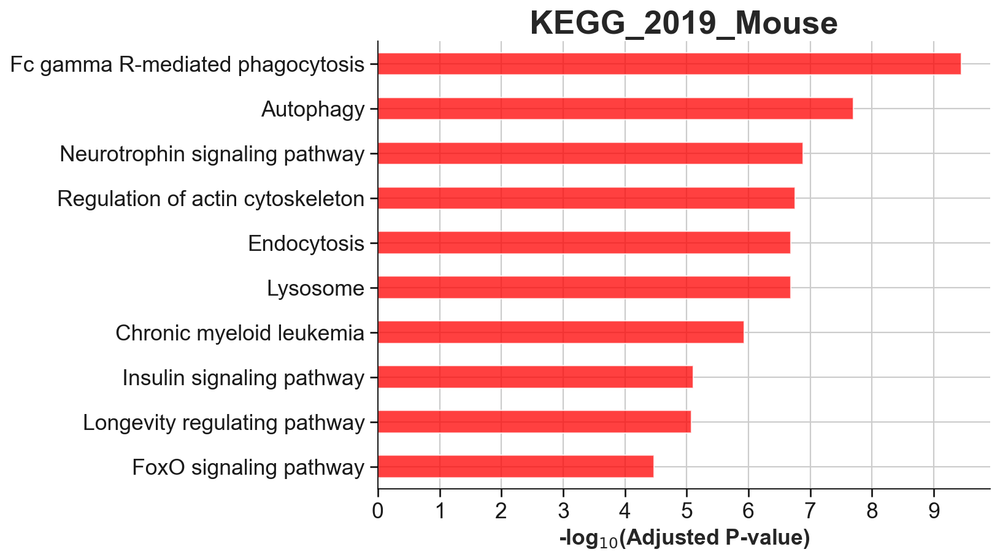

In [73]:
sc.set_figure_params(figsize=(8, 8))
gseapy.barplot(enr_res.res2d,title='KEGG_2019_Mouse',top_term=10,color='red',figsize=(8,6))

## Heatmaps of gene expression of top DEA genes

### All Brainstem samples

In [115]:
marker_genes_dict = dict()

marker_genes_dict = {'Exci-BS': adata_inhi_BS_res_UP['gene'].head(20)}
marker_genes_dict = marker_genes_dict['Exci-BS'].drop(18)

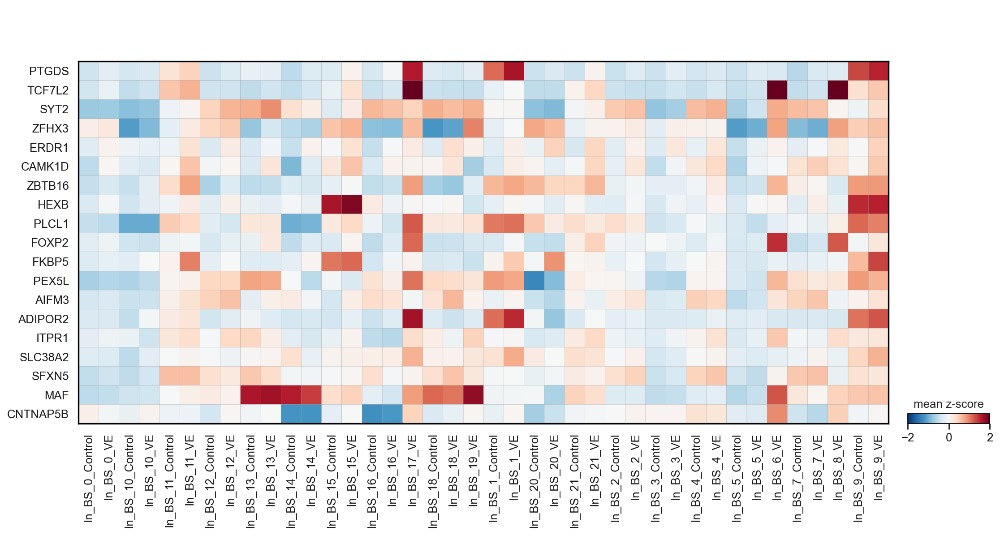

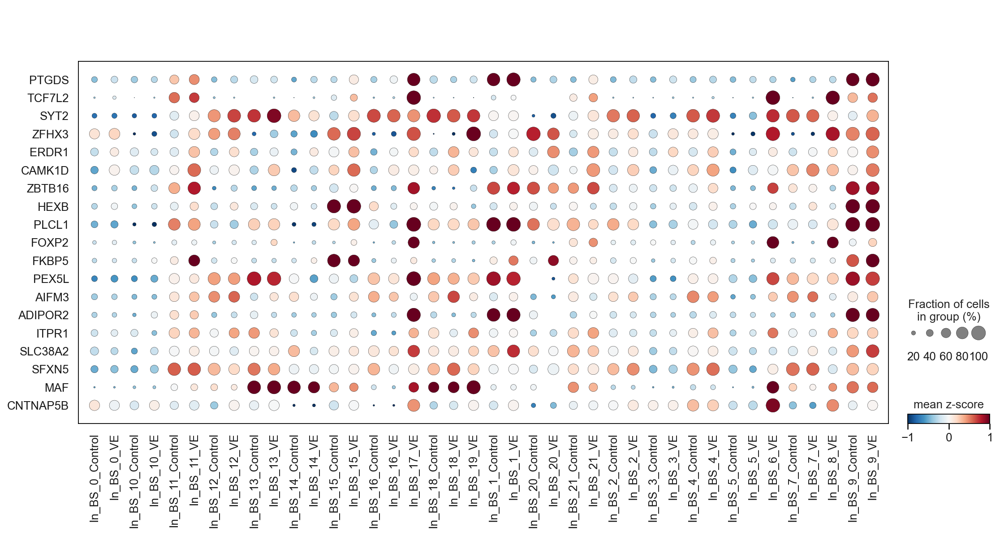

In [121]:
sc.set_figure_params(figsize=(8, 8))
adata_inhi_BS.layers['scaled'] = sc.pp.scale(adata_inhi_BS, copy=True).X
sc.pl.matrixplot(adata_inhi_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_inhi_BS_str','Condition'], dendrogram=False,
                 colorbar_title='mean z-score', layer='scaled', vmin=-2, vmax=2, cmap='RdBu_r',swap_axes=True)

sc.pl.dotplot(adata_inhi_BS, marker_genes_dict, groupby=['PhenoGraph_clusters_inhi_BS_str','Condition'], dendrogram=False,
colorbar_title='mean z-score', layer='scaled', vmin=-1, vmax=1, cmap='RdBu_r',swap_axes=True)

In [ ]:
'In_BS_0','In_BS_1', 'In_BS_2','In_BS_3',
    4 : 'In_BS_4',
    5 : 'In_BS_5',
    6 : 'In_BS_6',
    7 : 'In_BS_7',
    8 : 'In_BS_8',
    9 : 'In_BS_9',
    10 : 'In_BS_10',
    11 : 'In_BS_11',
    12 : 'In_BS_12',
    13 : 'In_BS_13',
    14 : 'In_BS_14',
    15 : 'In_BS_15',
    16 : 'In_BS_16',
    17 : 'In_BS_17',
    18 : 'In_BS_18',
    19 : 'In_BS_19',
    20 : 'In_BS_20',
    21 : 'In_BS_21'

# Inhibitory Neurons BS control 

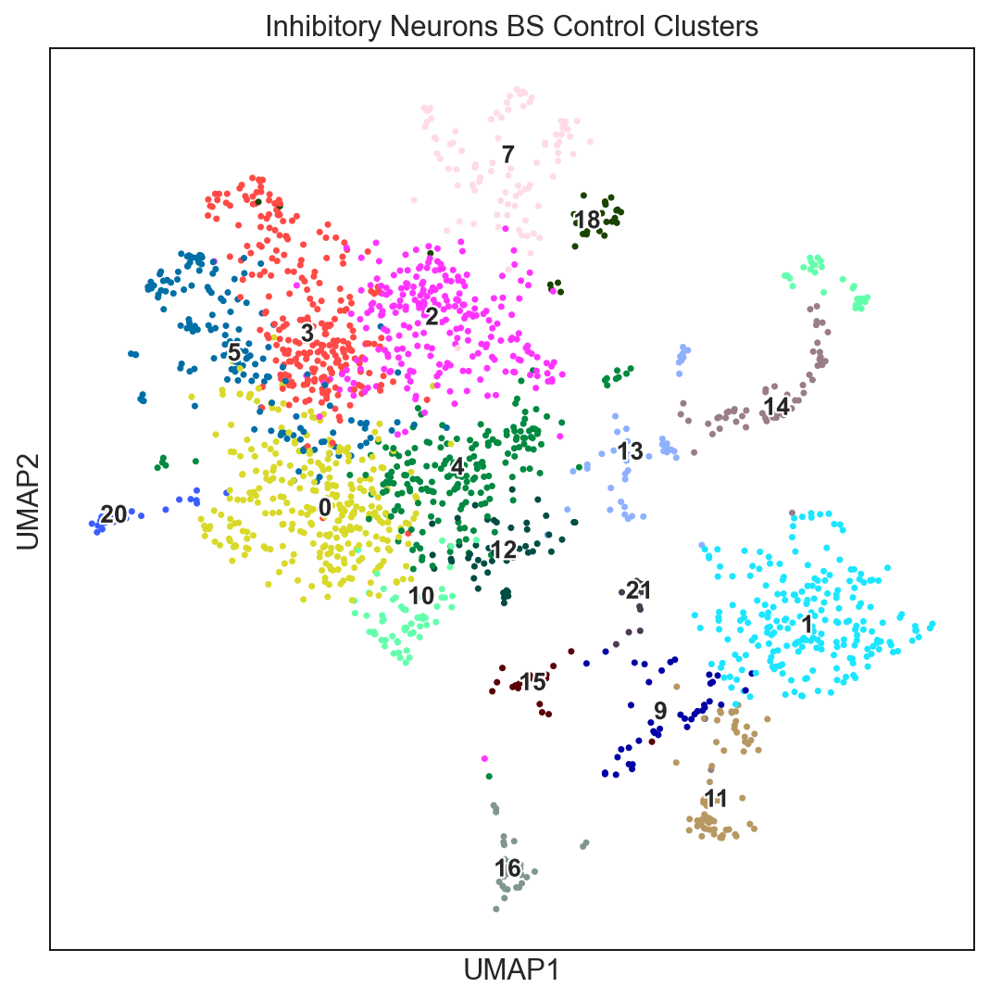

In [94]:
adata_inhi_BS_control = adata_inhi_BS[adata_inhi_BS.obs['Condition'].isin(['Control']),:].copy()

sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_inhi_BS_control, 
           color= ['PhenoGraph_clusters_inhi_BS'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=["#d9d929", "#1CE6FF", "#FF34FF", "#FF4A46", "#008941", "#006FA6",
    "#FFDBE5", "#0000A6", "#63FFAC", "#B79762", "#004D43", "#8FB0FF", "#997D87",
    "#5A0007", "#809693", "#1B4400", "#3B5DFF", "#4A3B53"],
           size=40, 
           legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Inhibitory Neurons BS Control Clusters"])

In [84]:
cell_counts_per_cluster_BS_ctrl = adata_inhi_BS_control.obs.PhenoGraph_clusters_inhi_BS.value_counts()
cell_counts_per_cluster_BS_ctrl = cell_counts_per_cluster_BS_ctrl.to_frame()
cell_counts_per_cluster_BS_ctrl

,PhenoGraph_clusters_inhi_BS
0,305
3,255
2,247
1,215
4,200
5,161
10,90
7,90
11,65
14,59


# Inhibitory Neurons BS VE

/Users/fragkogs/opt/anaconda3/envs/std/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


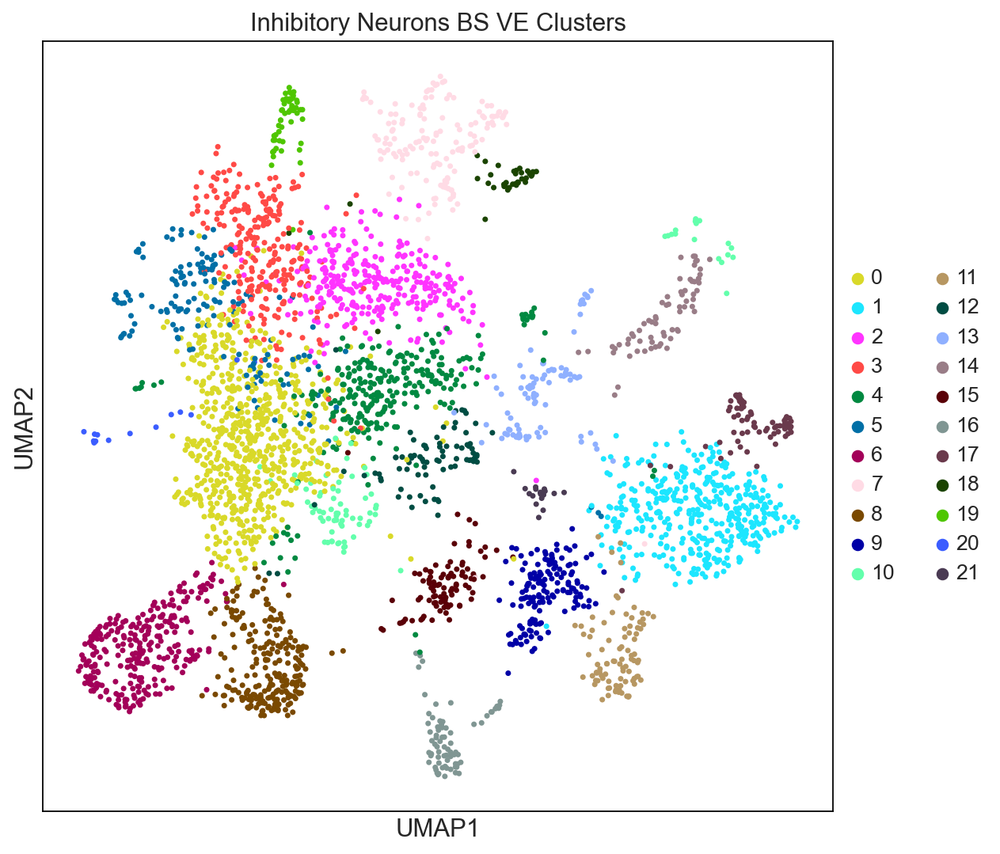

In [122]:
adata_inhi_BS_VE = adata_inhi_BS[adata_inhi_BS.obs['Condition'].isin(['VE']),:].copy()

sc.set_figure_params(figsize=(8, 8))
sc.pl.umap(adata_inhi_BS_VE, 
           color= ['PhenoGraph_clusters_inhi_BS'],
           ncols=2,
           edges = False,
           edges_width= 0.01,
           palette=godsnot_64,
           size=40, 
           #legend_loc='on data', 
           legend_fontsize=12,
           legend_fontoutline=2,
           title=["Inhibitory Neurons BS VE Clusters"])

In [88]:
cell_counts_per_cluster_BS_VE = adata_inhi_BS_VE.obs.PhenoGraph_clusters_inhi_BS.value_counts()
cell_counts_per_cluster_BS_VE = cell_counts_per_cluster_BS_VE.to_frame()
cell_counts_per_cluster_BS_VE

,PhenoGraph_clusters_inhi_BS
0,684
1,394
2,301
6,281
4,272
3,255
8,234
5,153
9,153
7,146


# Make a grouped bar plot of the number of cells per cluster per condition

**Brainstem**

In [140]:
# First merge the 2 data frames by indeces
mergedDF= cell_counts_per_cluster_BS_ctrl.merge(cell_counts_per_cluster_BS_VE, left_index=True, right_index=True, suffixes=('_Control', '_VE'),how = 'outer')
mergedDF.rename(columns = {'PhenoGraph_clusters_inhi_BS_Control' : 'Control', 'PhenoGraph_clusters_inhi_BS_VE' : 'VE'}, inplace = True)
mergedDF

,Control,VE
0,305.0,684
1,215.0,394
2,247.0,301
3,255.0,255
4,200.0,272
5,161.0,153
6,NaN,281
7,90.0,146
8,NaN,234
9,42.0,153


In [141]:
mergedDF = mergedDF.reset_index()
mergedDF = mergedDF.melt(id_vars=["index"])
mergedDF.rename(columns = {'index' : 'ClusterID', 'variable' : 'Condition', 'value' : 'N_cells'}, inplace = True)
mergedDF

,ClusterID,Condition,N_cells
0,0,Control,305.0
1,1,Control,215.0
2,2,Control,247.0
3,3,Control,255.0
4,4,Control,200.0
5,5,Control,161.0
6,6,Control,NaN
7,7,Control,90.0
8,8,Control,NaN
9,9,Control,42.0


In [149]:
#order = [0,22,10,32,11,33,12,34,13,35,14,36,15,37,16,38,17,39,18,40,19,41,1,23,20,42,21,43,2, 24,3,25,4,26,5,27,6,28,7,29,8,30,9,31]
order = [0,10,11,12,13,14,15,16,17,18,19,1,20,21,2,3,4,5,6,7,8,9]
type(order)

list

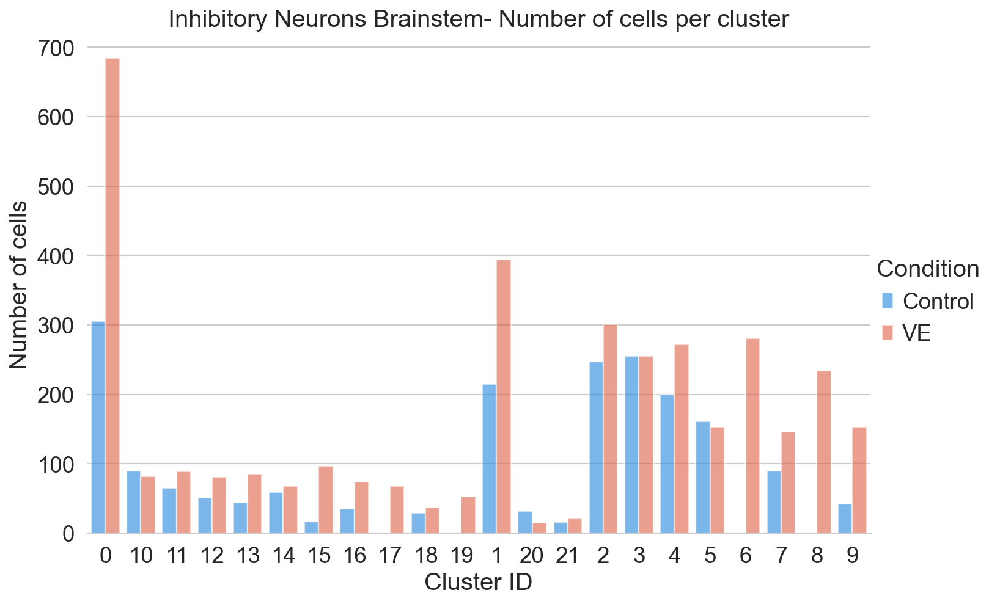

In [154]:
sns.set(font_scale=1.5, style = 'whitegrid',) 
# Draw a nested barplot by species and sex
g = sns.catplot(
    data=mergedDF, kind="bar",
    x="ClusterID", y="N_cells", hue="Condition",
    ci="sd", palette=['#0488FC','#F64E2C'], alpha=.6, height=6,aspect=1.5, order= order)
g.despine(left=True)
g.set(title='Inhibitory Neurons Brainstem- Number of cells per cluster')
g.set_axis_labels("Cluster ID", "Number of cells")